<a href="https://colab.research.google.com/github/bitunsen/datascience/blob/master/cassava_leaf_disease_classification_keras_vgg16.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install --upgrade --force-reinstall --no-deps kaggle

     |████████████████████████████████| 61kB 6.1MB/s 
  Created wheel for kaggle: filename=kaggle-1.5.10-cp36-none-any.whl size=73269 sha256=5d7d0ec82112aaa945dc54468cb1cbe5a9d655398fbf3dfd498885ca2fc94c95
  Stored in directory: /root/.cache/pip/wheels/3a/d1/7e/6ce09b72b770149802c653a02783821629146983ee5a360f10
Successfully built kaggle
  Found existing installation: kaggle 1.5.9
    Uninstalling kaggle-1.5.9:
      Successfully uninstalled kaggle-1.5.9


In [2]:
!mkdir /root/.kaggle
!pwd

/content


In [3]:
!touch ~/.kaggle/kaggle.json

api_token = {"username":"bitunsen","key":"c6e2314c8361a066bfadb1be893f69cb"}

import json

with open('/root/.kaggle/kaggle.json', 'w') as file:
    json.dump(api_token, file)

!chmod 600 ~/.kaggle/kaggle.json

In [4]:
!ls -lrt ~/.kaggle/kaggle.json

-rw------- 1 root root 67 Dec  6 20:56 /root/.kaggle/kaggle.json


In [5]:
!rm -rf cassava-leaf-disease-classification.zip

In [5]:
import kaggle

In [6]:
!kaggle competitions download -c cassava-leaf-disease-classification

100% 5.74G/5.76G [01:43<00:00, 66.2MB/s]
100% 5.76G/5.76G [01:43<00:00, 60.0MB/s]


In [7]:
!ls -lrt

total 6040696
drwxr-xr-x 1 root root       4096 Dec  2 22:04 sample_data
-rw-r--r-- 1 root root 6185662420 Dec  6 20:58 cassava-leaf-disease-classification.zip


In [8]:
!mkdir cassava-leaf-disease-classification


In [9]:
!pwd


/content


In [10]:
from zipfile import ZipFile
with ZipFile('/content/cassava-leaf-disease-classification.zip', 'r') as zipObj:
   # Extract all the contents of zip file in current directory
   zipObj.extractall('/content/cassava-leaf-disease-classification/')

In [12]:
!ls -lrt cassava-leaf-disease-classification/

total 1088
drwxr-xr-x 2 root root   4096 Dec  6 20:58 test_images
-rw-r--r-- 1 root root     32 Dec  6 20:58 sample_submission.csv
-rw-r--r-- 1 root root    172 Dec  6 20:58 label_num_to_disease_map.json
drwxr-xr-x 2 root root   4096 Dec  6 20:58 test_tfrecords
-rw-r--r-- 1 root root 358283 Dec  6 20:58 train.csv
drwxr-xr-x 2 root root 729088 Dec  6 20:58 train_images
drwxr-xr-x 2 root root   4096 Dec  6 20:59 train_tfrecords


In [13]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [14]:
RUNTIME = "COLLAB"

In [15]:
BASE_DIR = "/kaggle/input/cassava-leaf-disease-classification/"
TRAIN_DIR = "/kaggle/input/cassava-leaf-disease-classification/train_images/"
TEST_DIR = "/kaggle/input/cassava-leaf-disease-classification/test_images/"

In [16]:
if RUNTIME == "COLLAB":
  BASE_DIR = "/content/cassava-leaf-disease-classification/"
  TRAIN_DIR = "/content/cassava-leaf-disease-classification/train_images/"
  TEST_DIR = "/content/cassava-leaf-disease-classification/test_images/"

In [17]:
!ls -lrt /content/cassava-leaf-disease-classification/test_images/

total 144
-rw-r--r-- 1 root root 144281 Dec  6 20:58 2216849948.jpg


In [18]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import matplotlib.pyplot as plt
import json
import cv2
from PIL import Image

In [19]:
with open(os.path.join(BASE_DIR, "label_num_to_disease_map.json")) as file:
    map_classes = json.loads(file.read())
    
print(json.dumps(map_classes, indent=2))

{
  "0": "Cassava Bacterial Blight (CBB)",
  "1": "Cassava Brown Streak Disease (CBSD)",
  "2": "Cassava Green Mottle (CGM)",
  "3": "Cassava Mosaic Disease (CMD)",
  "4": "Healthy"
}


In [52]:
label_list = [int(key) for key in map_classes.keys()]
label_list

[0, 1, 2, 3, 4]

In [20]:
input_files = os.listdir(os.path.join(BASE_DIR, "train_images"))
print(f"Number of train images: {len(input_files)}")

Number of train images: 21397


In [21]:
data_df = pd.read_csv(os.path.join(BASE_DIR, "train.csv"))
data_df.head(5)

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


In [22]:
data_df.shape

(21397, 2)

In [23]:
data_df["class_name"] = data_df["label"].astype(str).map(map_classes)

data_df

,image_id,label,class_name
0,1000015157.jpg,0,Cassava Bacterial Blight (CBB)
1,1000201771.jpg,3,Cassava Mosaic Disease (CMD)
2,100042118.jpg,1,Cassava Brown Streak Disease (CBSD)
3,1000723321.jpg,1,Cassava Brown Streak Disease (CBSD)
4,1000812911.jpg,3,Cassava Mosaic Disease (CMD)
...,...,...,...
21392,999068805.jpg,3,Cassava Mosaic Disease (CMD)
21393,999329392.jpg,3,Cassava Mosaic Disease (CMD)
21394,999474432.jpg,1,Cassava Brown Streak Disease (CBSD)
21395,999616605.jpg,4,Healthy


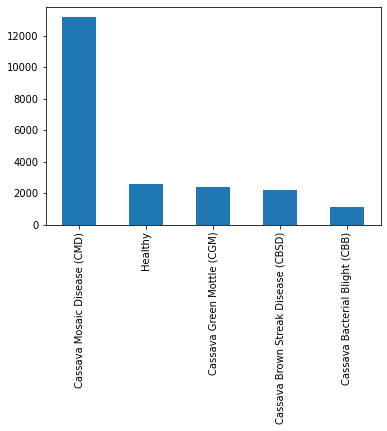

In [24]:
data_df['class_name'].value_counts().plot(kind='bar')

In [46]:
np.unique(data_df['class_name'])

array(['Cassava Bacterial Blight (CBB)',
       'Cassava Brown Streak Disease (CBSD)',
       'Cassava Green Mottle (CGM)', 'Cassava Mosaic Disease (CMD)',
       'Healthy'], dtype=object)

In [55]:
from sklearn.utils import compute_class_weight
class_weight_array = compute_class_weight('balanced', label_list, data_df['label'])
class_weight_dict = dict()
for label, weight in zip(label_list, class_weight_array):
  class_weight_dict[label] = weight
class_weight_dict

{0: 3.9368905243790246,
 1: 1.954956601187757,
 2: 1.7935456831517183,
 3: 0.3252317981456148,
 4: 1.6606131160263873}

In [27]:
def viewImage(_image_path, _image_id):
    figure = plt.figure(figsize=(16, 8))
    _image_path = os.path.join(_image_path, image_id)
    img_data = Image.open(_image_path)
    plt.axis('off')
    plt.imshow(img_data)

In [28]:
def display_images_by_class(_class_name, _image_list):
    figure = plt.figure(figsize=(24, 24))
    i = 0
    for image_id in _image_list:
        _image_path = os.path.join(BASE_DIR, "train_images")
        _image_path = os.path.join(_image_path, image_id)
        img_data = Image.open(_image_path)
        plt.subplot(4, 4, i+1)
        plt.axis('off')
        plt.imshow(img_data, cmap='gray_r')
        plt.title(_class_name)
        i += 1

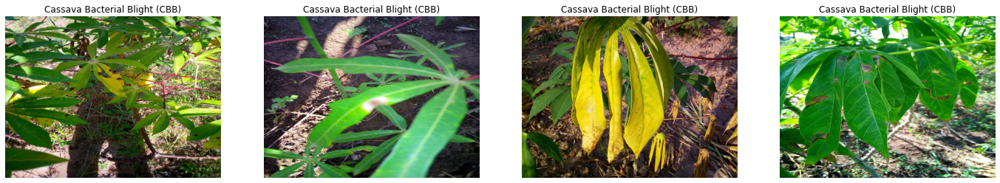

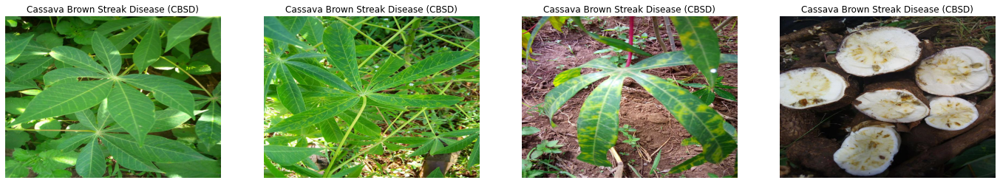

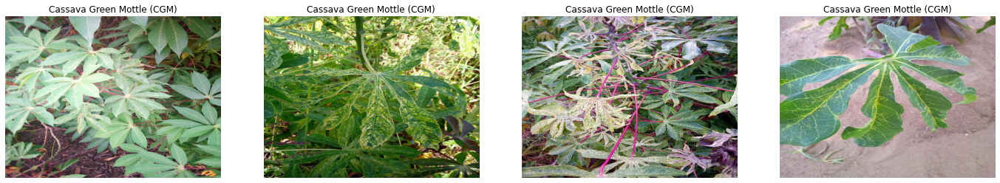

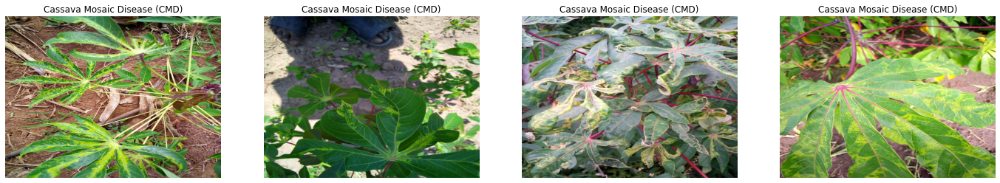

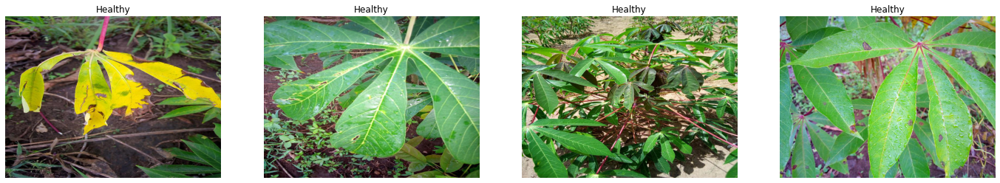

In [29]:
sample_image_dict = {}
for class_label in map_classes:
    #print(map_classes[class_label])
    _temp_image_list = data_df[data_df['label'] == int(class_label)].head(4)['image_id'].tolist()
    #print(_temp_image_list)
    sample_image_dict[map_classes[class_label]] = _temp_image_list
    display_images_by_class(map_classes[class_label], _temp_image_list)


In [30]:
from albumentations import (
    Compose, HorizontalFlip, CLAHE, HueSaturationValue,
    RandomBrightness, RandomContrast, RandomGamma,Cutout,
    ToFloat, ShiftScaleRotate
)

In [31]:
AUGMENTATIONS_TRAIN = Compose([
    HorizontalFlip(p=0.5),
    RandomContrast(limit=0.2, p=0.5),
    RandomGamma(gamma_limit=(80, 120), p=0.5),
    RandomBrightness(limit=0.2, p=0.5),
    HueSaturationValue(hue_shift_limit=5, sat_shift_limit=20, val_shift_limit=10, p=.9),
    #Cutout(always_apply=False, p=1.0, num_holes=28, max_h_size=8, max_w_size=8),
    ShiftScaleRotate(
        shift_limit=0.0625, scale_limit=0.1, 
        rotate_limit=15, border_mode=cv2.BORDER_REFLECT_101, p=0.8), 
    ToFloat(max_value=255)
])

AUGMENTATIONS_TEST = Compose([
    ToFloat(max_value=255)
])

In [32]:
def display_augmented_images_by_class(_class_name, _image_list):
    
    i = 0
    for image_id in _image_list:
        figure = plt.figure(figsize=(24, 16))
        _image_path = os.path.join(BASE_DIR, "train_images")
        _image_path = os.path.join(_image_path, image_id)
        img_data = Image.open(_image_path)
        plt.subplot(4, 4, 1)
        plt.axis('off')
        plt.imshow(img_data, cmap='gray_r')
        plt.title("ORG :: " + _class_name)
        img_data = np.array(img_data.resize((224, 224), Image.ANTIALIAS))
        for img_count in range(2, 5):
            aug_img_data = AUGMENTATIONS_TRAIN(image=img_data)["image"]
            plt.subplot(4, 4, img_count)
            plt.axis('off')
            plt.imshow(aug_img_data, cmap='gray_r')
            plt.title("AUG :: " + _class_name)
        

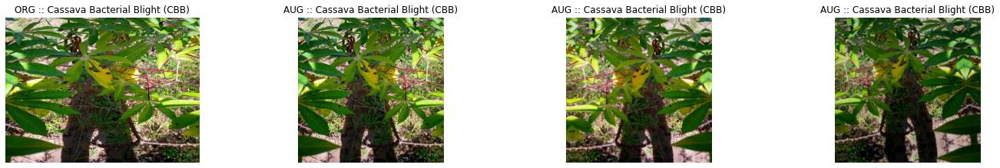

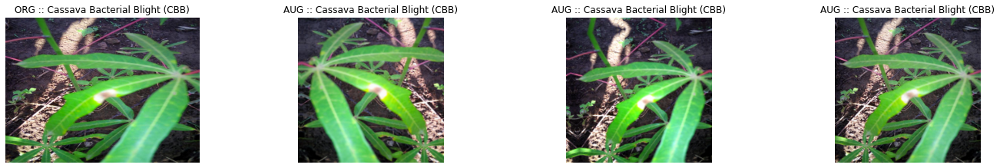

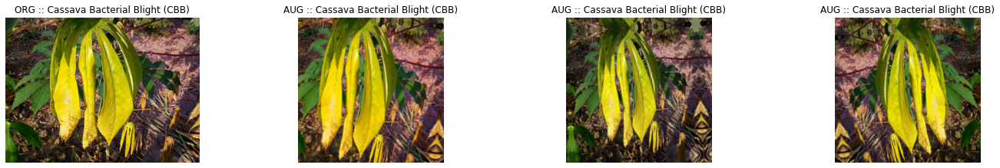

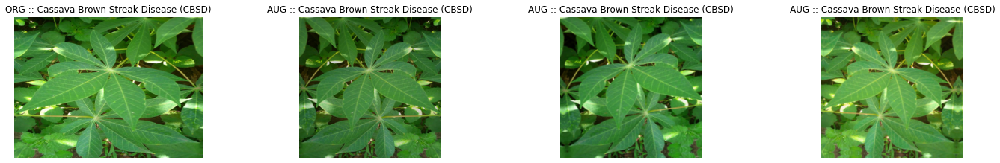

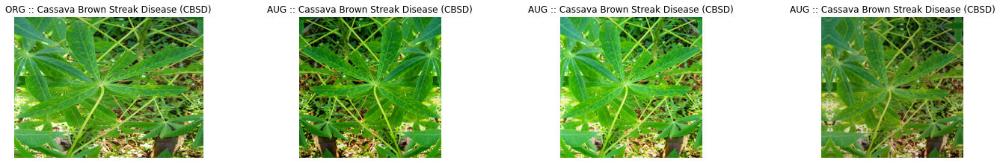

...

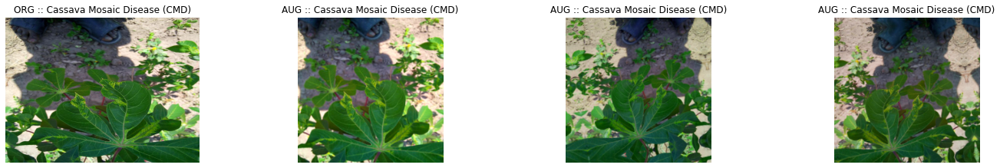

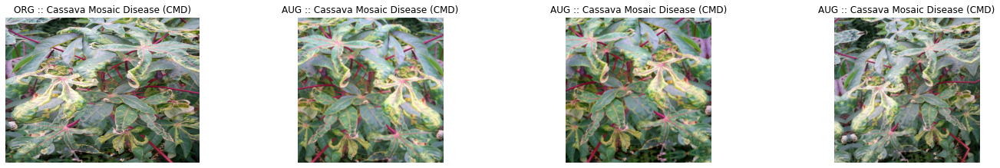

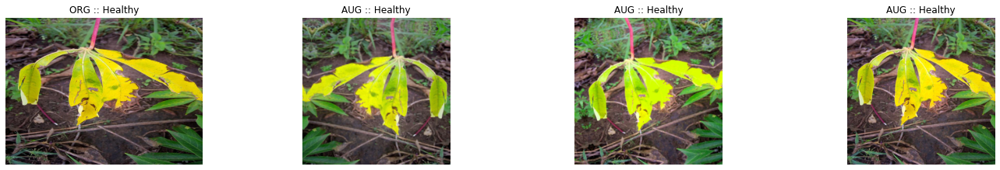

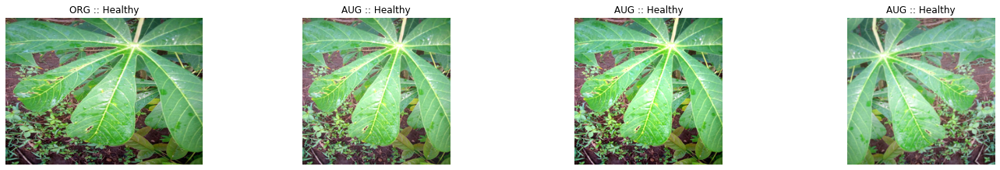

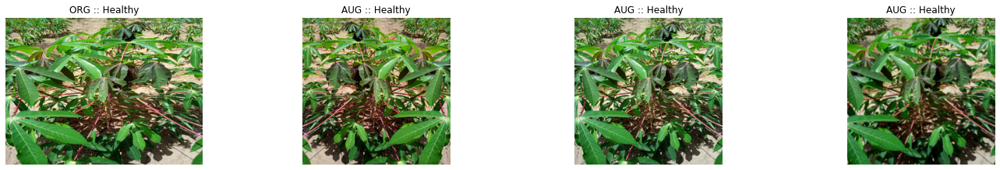

In [33]:
for class_label in map_classes:
    _temp_image_list = data_df[data_df['label'] == int(class_label)].head(3)['image_id'].tolist()
    display_augmented_images_by_class(map_classes[class_label], _temp_image_list)
    

In [34]:
from sklearn.model_selection import train_test_split

In [35]:
train_images, validate_images, train_labels, validate_labels = train_test_split(data_df['image_id'], data_df['label'], test_size=0.30, random_state=42, stratify=data_df['label'])
print("Size of Training Set : ", train_images.shape)
print("Size of Training Label : ", train_labels.shape)
print("Size of Validation Set : ", validate_images.shape)
print("Size of Validation Label : ", validate_labels.shape)

Size of Training Set :  (14977,)
Size of Training Label :  (14977,)
Size of Validation Set :  (6420,)
Size of Validation Label :  (6420,)


In [36]:
batch_size = 128
train_data_size = train_images.shape[0]
validate_data_size = validate_images.shape[0]

print("Batch Size : {}, Training Size : {}, Validation Size : {}".format(batch_size, train_data_size, validate_data_size))

Batch Size : 128, Training Size : 14977, Validation Size : 6420


In [37]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, array_to_img
from tensorflow.keras.applications.imagenet_utils import preprocess_input, decode_predictions

In [39]:
from tensorflow.python.keras.utils.data_utils import Sequence
import random

def load_single_image(data_type, image_id):
        if data_type == "TEST_DATA":
            image_path = os.path.join(TEST_DIR, image_id)
        else:
            image_path = os.path.join(TRAIN_DIR, image_id)
        img_data = Image.open(image_path)
        img_data = np.array(img_data.resize((224, 224), Image.ANTIALIAS))
        #print(img_data)
        return img_data
    
    
class AugmentedImageSequence(Sequence):
    def __init__(self, mode, data_set_type, x_set, y_set, batch_size, augmentations):
        self.mode = mode
        self.data_type = data_set_type
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size
        self.augment = augmentations

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    
    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        
        if self.mode == "TEST":
            batch_y = []
        else:
            batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
        
        #print("length of Batch_X : {}".format(len(batch_x)))
        img_list = []
        for x in batch_x:
            if self.data_type == "TRAIN_DATA":
                random_num = random.uniform(0, 1)
                if random_num > 0.5:
                    img_data = self.augment(image=load_single_image(self.data_type, x))["image"]
                else:
                    img_data = load_single_image(self.mode, x)
            else:
                img_data = load_single_image(self.mode, x)
            
            img_list.append(img_data)
        
        #print("length of img_list : {}".format(len(img_list)))
        img_array = np.stack([img_data for img_data in img_list], axis=0)
        
        return img_array, np.array(batch_y)

In [40]:
train_gen = AugmentedImageSequence("TRAIN", "TRAIN_DATA", train_images, train_labels, 128, augmentations=AUGMENTATIONS_TRAIN)
valid_gen = AugmentedImageSequence("TRAIN", "VALIDATE_DATA", validate_images, validate_labels, 128, augmentations=AUGMENTATIONS_TEST)

In [41]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, InputLayer
from tensorflow.keras.layers import BatchNormalization, Activation
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import RMSprop
from keras.applications import VGG16

In [42]:
if RUNTIME == "COLLAB":
  vgg16 = VGG16(include_top = False, input_shape=(224, 224, 3))
else:
  vgg16 = VGG16(include_top = False, input_shape=(224, 224, 3),
              weights="../input/vgg16/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5")

vgg16.summary()

58892288/58889256 [==============================] - 2s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
______________________________________________________________

In [43]:
vgg16.trainable = False # Freeze VGG16 base
model = Sequential()
model.add(vgg16)
model.add(Flatten())
model.add(Dense(1024 , activation = "relu")) #Added New
model.add(Dropout(0.3)) #Added New
model.add(Dense(512 , activation = "relu"))
model.add(Dense(units = 5 , activation = "softmax"))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten (Flatten)            (None, 25088)             0         
_________________________________________________________________
dense (Dense)                (None, 1024)              25691136  
_________________________________________________________________
dropout (Dropout)            (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               524800    
_________________________________________________________________
dense_2 (Dense)              (None, 5)                 2565      
Total params: 40,933,189
Trainable params: 26,218,501
Non-trainable params: 14,714,688
___________________________________

In [44]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras import optimizers

earlystop = EarlyStopping(patience=10)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)
mcp_save = ModelCheckpoint('best_my_mdl_wts.hdf5', 
                           save_best_only=True, monitor='val_loss', mode='min')
custom_callbacks = [earlystop, mcp_save, learning_rate_reduction]
print(custom_callbacks)

[<tensorflow.python.keras.callbacks.EarlyStopping object at 0x7f01a00c2ac8>, <tensorflow.python.keras.callbacks.ModelCheckpoint object at 0x7f01a00c2b00>, <tensorflow.python.keras.callbacks.ReduceLROnPlateau object at 0x7f01a00c2c50>]


In [57]:
model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizers.RMSprop(lr=1e-5), metrics=['acc'])
history = model.fit(
    train_gen, 
    epochs=40,
    validation_data=valid_gen,
    validation_steps=validate_data_size//batch_size,
    steps_per_epoch=train_data_size//batch_size,
    callbacks=custom_callbacks,
    class_weight=class_weight_dict
)

Epoch 1/40
117/117 [==============================] - 336s 3s/step - loss: 3.7114 - acc: 0.3748 - val_loss: 3.3264 - val_acc: 0.4519
Epoch 2/40
117/117 [==============================] - 322s 3s/step - loss: 2.8199 - acc: 0.4496 - val_loss: 2.8335 - val_acc: 0.4695
Epoch 3/40
117/117 [==============================] - 320s 3s/step - loss: 2.4134 - acc: 0.4847 - val_loss: 2.4254 - val_acc: 0.5227
Epoch 4/40
117/117 [==============================] - 322s 3s/step - loss: 2.0104 - acc: 0.5233 - val_loss: 2.2294 - val_acc: 0.5295
Epoch 5/40
117/117 [==============================] - 321s 3s/step - loss: 1.7999 - acc: 0.5422 - val_loss: 2.1082 - val_acc: 0.5433
Epoch 6/40
117/117 [==============================] - 319s 3s/step - loss: 1.6257 - acc: 0.5590 - val_loss: 2.1155 - val_acc: 0.5303
Epoch 7/40
117/117 [==============================] - 315s 3s/step - loss: 1.4512 - acc: 0.5863 - val_loss: 1.9344 - val_acc: 0.5527
Epoch 8/40
117/117 [==============================] - 317s 3s/step - 

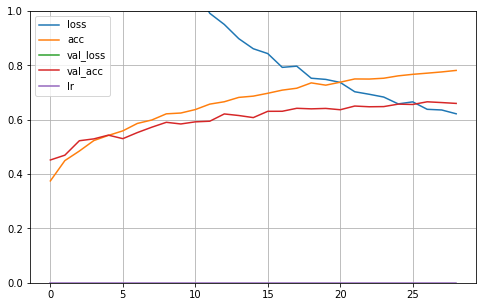

In [58]:

pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1) # setting limits for y-axis
plt.show()




In [59]:
model.save("Cassava_VGG16_ImageAugmentation001.h5")

In [45]:
vgg16_json = model.to_json()
with open("Cassava_VGG16_MODEL_001.json", "w") as json_file:
  json_file.write(vgg16_json)

In [46]:
model.save_weights("Cassava_VGG16_ImageAugmentation001_Weights.h5")

In [47]:
test_filenames = os.listdir(TEST_DIR)
test_df = pd.DataFrame({
    'image_id': test_filenames
})
test_samples = test_df.shape[0]
test_samples

1

In [48]:
test_df.head(4)

,image_id
0,2216849948.jpg


In [49]:
test_gen = AugmentedImageSequence("TEST", "TEST_DATA", test_df['image_id'], None, 128, augmentations=AUGMENTATIONS_TEST)

In [50]:
predict = model.predict(test_gen, steps=np.ceil(test_samples/batch_size))

FileNotFoundError: ignored

In [ ]:
test_results_list = []
for image_id, item in zip(test_df["image_id"], predict):
    print("Probabilities :: {}, :: Predicted Class : {}".format(item,np.argmax(item)))
    test_results_dict = {}
    test_results_dict["image_id"] = image_id
    test_results_dict["label"] = np.argmax(item)
    test_results_list.append(test_results_dict)

test_results_df = pd.DataFrame(test_results_list)
test_results_df.to_csv("submission.csv" ,index = False)

In [ ]:
submission = pd.read_csv("submission.csv")
submission.head(3)

In [ ]:
for image_id in test_df['image_id']:
    viewImage(TEST_DIR, image_id)

In [ ]:
sample_submission_df = pd.read_csv(os.path.join(BASE_DIR, "sample_submission.csv"))
sample_submission_df.head(4)

In [ ]:
test_analysis_gen = AugmentedImageSequence("TEST", "VALIDATE_DATA", validate_images, None, 128, augmentations=AUGMENTATIONS_TEST)


In [ ]:
test_analysis_samples = validate_images.shape[0]
test_analysis_samples

In [ ]:
test_analysispredict = model.predict(test_analysis_gen, 
                                     steps=np.ceil(test_analysis_samples/batch_size))

In [ ]:
validate_result_list = []
for image_id, predicted, actual in zip(validate_images, test_analysispredict, validate_labels):
    #print("Actual Class :: {}, :: Predicted Class : {}".format(actual, np.argmax(predicted)))
    validate_result_dict = {}
    validate_result_dict["image_id"] = image_id
    validate_result_dict["Actual"] = actual
    validate_result_dict["Predicted"] = np.argmax(predicted)
    validate_result_dict["IsMatched"] = 'NO'
    if actual == np.argmax(predicted):
        validate_result_dict["IsMatched"] = 'YES'
    validate_result_list.append(validate_result_dict)
    
validate_result_df = pd.DataFrame(validate_result_list)

In [ ]:
validate_result_df.head(10)

In [ ]:
validate_result_df[validate_result_df["Actual"] != 3]["IsMatched"].value_counts().plot(kind='bar')

In [ ]:
validate_result_df["IsMatched"].value_counts().plot(kind='bar')

In [ ]:
tf.keras.backend.clear_session() # clearing session
np.random.seed(42) # generating random see
tf.random.set_seed(42) # set.seed function helps reuse same set of random variables

In [ ]:
vgg16.trainable = False # Freeze VGG16 base
model = Sequential()
model.add(vgg16)
model.add(Flatten())
model.add(Dense(1024 , activation = "relu")) #Added New
model.add(Dropout(0.3)) #Added New
model.add(Dense(512 , activation = "relu"))
model.add(Dense(units = 5 , activation = "softmax"))
model.summary()

In [ ]:
model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizers.RMSprop(lr=1e-5), metrics=['acc'])
history = model.fit(
    train_gen, 
    epochs=15,
    validation_data=valid_gen,
    validation_steps=validate_data_size//batch_size,
    steps_per_epoch=train_data_size//batch_size,
    callbacks=callbacks
)

In [ ]:
model.compile(loss='sparse_categorical_crossentropy', 
              optimizer=optimizers.RMSprop(lr=1e-5), 
              metrics=['acc'])
history = model.fit(
    train_gen, 
    epochs=15,
    validation_data=valid_gen,
    validation_steps=validate_data_size//batch_size,
    steps_per_epoch=train_data_size//batch_size,
    callbacks=callbacks
)


In [ ]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1) # setting limits for y-axis
plt.show()

In [ ]:
a = ["None"]
if not a:
  print("a is None")
